In [1]:
%load_ext autoreload
%autoreload 2

In [13]:
from saxs_data_processing import io, manipulate, target_comparison, subtract
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
from sklearn import metrics

## User parameter setup

List of all background files to use. Data loading function will find associated data files in the same directory as backgrounds.

In [3]:
background_fps = ['/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_05_StoberRandomCampaignV2/03210_B9-T1_Ethanol_background__000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_07_randomcampaignV3/data/03218_D1-T1_Ethanol_background_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_11_randomV3_round2/03289_H6-T2_EtOH_background_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_15_Highlights_replicates/03357_D5-T2_Background_1_EtOH_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_10_17_randomBaselineV4/data/03439_C1-T2_EtOH_1_000.dat',
                  '/home/bgpelkie/gdrive_uw/Research/PozzoResearchGroup/Stober_synthesis/SAXS_data/2024_11_05_optimizationRound1/03533_F9-T1_Ethanol_background_1_000.dat']

Select q ranges. Right now this relies on manual q range selection to a certain extent. We subtract background and fit the spline on a larger q-range, then evaluate the spline on a subset of the larger q range to avoid spline edge effects.

In [4]:
# q range to consider up to and including spline fit step
q_min_subtract = 0.002
q_max_subtract = 0.035

# q range to interpolate spline fit on and perform distance metric calculation with
q_min_spl = 0.003
q_max_spl = 0.03
n_interpolate_gridpts = 1024 # number of grid points to interpolate q on.

Select target particle parameters. Target is spherical particles with radius r and polydispersity pdi

In [5]:
target_r_nm = 60
target_r_angs = target_r_nm*10
target_pdi = 0.08
sld_silica = 8.575
sld_etoh = 9.611

Set processing and optimization parameters for distance calculation

In [6]:
# SavGol denoise filter parameters
savgol_n = 15
savgol_order = 3
# minimum data length - data with less than ~100 data points is due to valid data selection step in subtraction and is likley too noisy to do anything with.
min_data_len = 100

# spline fit parameters
s = 0.05
k = 3

#scale parameters
n_avg = 100

# Amplitude-phase distance parameters
optim = "DP"
grid_dim = 10

## ######################## STOP: Don't touch anything below here \#############################


## Load data

In [9]:
sample_data, uuid2bkg = io.load_biocube_data_with_background(background_fps, 24)

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for b8953350-d5ad-4c99-b929-ebfe8febd0df. Check your file naming
  warnings.warn(
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for ea0d2ca6-8818-45f8-b5e3-04858133284a. Check your file naming
  warnings.warn(
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/io.py:150: UserWarning: Duplicate UUID found for 0ec4dd81-7487-4689-96b9-b0f646a2047d. Check your file naming
  warnings.warn(


## Calculate target scattering

In [10]:
q_grid = np.linspace(np.log10(q_min_spl), np.log10(q_max_spl), n_interpolate_gridpts)

q_grid_nonlog = 10**q_grid
target_I = target_comparison.target_intensities(q_grid_nonlog, target_r_angs, target_pdi, sld_silica, sld_etoh)
target_I = np.log10(target_I)

## Run full processing pipeline

In [39]:
processing_dataset = {}
for uuid_val, data_val in sample_data.items():
   
    data_val = sample_data[uuid_val]
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = 'valid'
            processing_dataset[uuid_val] = meas_entry
    
    
    # 2. Convert everything into log10 space
    q_log = np.log10(subtracted['q'].to_numpy())
    I_log = np.log10(subtracted['I'].to_numpy())
    
    meas_entry['q_log'] = q_log
    meas_entry['I_log'] = I_log
    
    # 3. denoise filter on intensity
    
    I_savgol = manipulate.denoise_intensity(I_log, savgol_n = savgol_n, savgol_order = savgol_order)
    
    meas_entry['I_savgol'] = I_savgol
    
    # 4. Spline fit and interpolate
    I_spline = manipulate.fit_interpolate_spline(q_log, I_savgol, q_grid, s = s, k = k)

    # drop zeros after spline
    drop_ind = I_spline['
    
    meas_entry['I_spline'] = I_spline
    
    # 5. scale onto target
    I_scaled = manipulate.scale_intensity_highqavg(I_spline, target_I, n_avg = n_avg)
    
    meas_entry['I_scaled'] = I_scaled
    
    #6. Calculate AP distance
    
    amplitude, phase = target_comparison.ap_distance(q_grid, I_scaled, target_I, optim = optim, grid_dim = grid_dim)
    
    ap_sum = amplitude + phase
    
    meas_entry['amplitude_distance'] = amplitude
    meas_entry['phase_distance'] = phase
    meas_entry['ap_sum_distance'] = ap_sum
    
    processing_dataset[uuid_val] = meas_entry


lo q: 15, hi q: 455
tensor(0.7786)
tensor(1.9037, dtype=torch.float64)
lo q: 14, hi q: 519
tensor(0.9031)
tensor(1.3700, dtype=torch.float64)
lo q: 14, hi q: 544
tensor(0.8618)
tensor(2.1060, dtype=torch.float64)
lo q: 14, hi q: 904
tensor(0.8867)
tensor(2.6674, dtype=torch.float64)
lo q: 15, hi q: 459
tensor(0.8740)
tensor(2.0023, dtype=torch.float64)
lo q: 101, hi q: 142
Sample d03dab18-5712-44f7-9334-14047212632e failed due to data length
lo q: 15, hi q: 416
tensor(0.8563)
tensor(2.1515, dtype=torch.float64)
lo q: 14, hi q: 435
tensor(0.9466)
tensor(1.0958, dtype=torch.float64)
lo q: 14, hi q: 453
tensor(0.8958)
tensor(2.5804, dtype=torch.float64)
lo q: 101, hi q: 220
Sample 4d5fd07b-987b-49df-b4ba-54d2a337d945 failed due to data length
lo q: 23, hi q: 172
tensor(0.8370)
tensor(12.3403, dtype=torch.float64)
lo q: 101, hi q: 172
Sample 657e707f-abc9-4f86-ae1e-9e59efb6e1f9 failed due to data length
lo q: 15, hi q: 412
tensor(0.8756)
tensor(3.6439, dtype=torch.float64)
lo q: 15, hi q: 

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/manipulate.py:148: RuntimeWarning: divide by zero encountered in log10
  I_scaled = np.log10(scaled_meas)


tensor(0.7911)
tensor(nan, dtype=torch.float64)
> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(39)_amplitude_distance()
     37         if torch.isnan(integral):
     38             pdb.set_trace()
---> 39         dist = torch.sqrt(integral)
     40 
     41     return dist



ipdb>  
ipdb>  
ipdb>  l


     34         y = (q1.qx.squeeze() - (q_gamma.squeeze() * torch.sqrt(gam_dev).squeeze())) ** 2
     35         integral = torch.trapezoid(y, q1.x)
     36         print(integral)
     37         if torch.isnan(integral):
     38             pdb.set_trace()
---> 39         dist = torch.sqrt(integral)
     40 
     41     return dist
     42 
     43 def _phase_distance(f1 : Function, f2 : Function, warping : Function)->torch.Tensor:
     44     """ Compute Phase distance between two functions given warping



ipdb>  l


     45 
     46     Parameters:
     47     ===========
     48         f1, f2 : funcshape.functions.Function
     49             function objects as defined in the Function class
     50         warping : funcshape.functions.Function
     51             Warping function aligning f2 to f1
     52 
     53     Returns:
     54     ===========
     55         dist : torch.Tensor



ipdb>  s


> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(41)_amplitude_distance()
     39         dist = torch.sqrt(integral)
     40 
---> 41     return dist
     42 
     43 def _phase_distance(f1 : Function, f2 : Function, warping : Function)->torch.Tensor:



ipdb>  s


--Return--
tensor(nan, d...torch.float64)
> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(41)_amplitude_distance()
     39         dist = torch.sqrt(integral)
     40 
---> 41     return dist
     42 
     43 def _phase_distance(f1 : Function, f2 : Function, warping : Function)->torch.Tensor:



ipdb>  s


> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(103)AmplitudePhaseDistance()
    101     da = _amplitude_distance(f1, f2, output[0])
    102 
--> 103     return da, dp, output
    104 
    105 def plot_warping(x, f1, f2, output):



ipdb>  s


--Return--
(tensor(nan, d...torch.float64), tensor(0.6581), (<funcshape.fu...x742db22a6570>, CurveReparame...Metric()
  )
), array([5.3172..., 5.30810909])))
> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(103)AmplitudePhaseDistance()
    101     da = _amplitude_distance(f1, f2, output[0])
    102 
--> 103     return da, dp, output
    104 
    105 def plot_warping(x, f1, f2, output):



ipdb>  s


> /home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/target_comparison.py(125)ap_distance()
    123     )
    124 
--> 125     return amplitude, phase
    126 
    127 



ipdb>  s


--Return--
(tensor(nan, d...torch.float64), tensor(0.6581))
> /home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/target_comparison.py(125)ap_distance()
    123     )
    124 
--> 125     return amplitude, phase
    126 
    127 



ipdb>  s


> /tmp/ipykernel_238814/373801030.py(65)<module>()
     63     amplitude, phase = target_comparison.ap_distance(q_grid, I_scaled, target_I, optim = optim, grid_dim = grid_dim)
     64 
---> 65     ap_sum = amplitude + phase
     66 
     67     meas_entry['amplitude_distance'] = amplitude



ipdb>  s


> /tmp/ipykernel_238814/373801030.py(67)<module>()
     65     ap_sum = amplitude + phase
     66 
---> 67     meas_entry['amplitude_distance'] = amplitude
     68     meas_entry['phase_distance'] = phase
     69     meas_entry['ap_sum_distance'] = ap_sum



ipdb>  s


> /tmp/ipykernel_238814/373801030.py(68)<module>()
     66 
     67     meas_entry['amplitude_distance'] = amplitude
---> 68     meas_entry['phase_distance'] = phase
     69     meas_entry['ap_sum_distance'] = ap_sum
     70 



ipdb>  s


> /tmp/ipykernel_238814/373801030.py(69)<module>()
     67     meas_entry['amplitude_distance'] = amplitude
     68     meas_entry['phase_distance'] = phase
---> 69     meas_entry['ap_sum_distance'] = ap_sum
     70 
     71     processing_dataset[uuid_val] = meas_entry



ipdb>  c


lo q: 13, hi q: 512
tensor(0.9030)
tensor(2.0214, dtype=torch.float64)
lo q: 12, hi q: 601
tensor(0.8755)
tensor(1.5140, dtype=torch.float64)
lo q: 69, hi q: 147
Sample 649ddf37-37fe-4a30-896b-010286133a28 failed due to data length
lo q: 19, hi q: 228
tensor(0.8620)
tensor(5.9670, dtype=torch.float64)
lo q: 13, hi q: 518
tensor(0.9053)
tensor(2.0375, dtype=torch.float64)
lo q: 16, hi q: 270
tensor(0.8749)
tensor(3.1552, dtype=torch.float64)
lo q: 14, hi q: 493
tensor(0.8465)
tensor(1.9314, dtype=torch.float64)
lo q: 15, hi q: 312
tensor(0.8576)
tensor(2.9203, dtype=torch.float64)
lo q: 13, hi q: 512
tensor(0.8520)
tensor(1.9091, dtype=torch.float64)
lo q: 23, hi q: 194
tensor(0.8646)
tensor(5.5574, dtype=torch.float64)
lo q: 13, hi q: 525
tensor(0.8875)
tensor(1.8030, dtype=torch.float64)
lo q: 15, hi q: 303
tensor(0.8100)
tensor(3.5552, dtype=torch.float64)
lo q: 716, hi q: 904
Sample f2e85141-9985-49ff-a6bc-17e2ecbcdc8b failed due to data length
lo q: 15, hi q: 521
tensor(0.8384)
ten

/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:137: UserWarning: Insufficient data points in q range with scattering. Check data quality
  warnings.warn(


tensor(0.8705)
tensor(2.4753, dtype=torch.float64)
lo q: 13, hi q: 436
tensor(0.8822)
tensor(2.5477, dtype=torch.float64)
lo q: 13, hi q: 456
tensor(0.9366)
tensor(1.5132, dtype=torch.float64)
lo q: 431, hi q: 593
Sample bfcf29cb-db74-40a1-9d27-911985c3f28f failed due to data length
lo q: 29, hi q: 904
tensor(0.8464)
tensor(3.2607, dtype=torch.float64)
lo q: 22, hi q: 904
tensor(0.8540)
tensor(2.9307, dtype=torch.float64)
lo q: 91, hi q: 904
tensor(0.7812)
tensor(nan, dtype=torch.float64)
> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(39)_amplitude_distance()
     37         if torch.isnan(integral):
     38             pdb.set_trace()
---> 39         dist = torch.sqrt(integral)
     40 
     41     return dist



ipdb>  s


> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(41)_amplitude_distance()
     39         dist = torch.sqrt(integral)
     40 
---> 41     return dist
     42 
     43 def _phase_distance(f1 : Function, f2 : Function, warping : Function)->torch.Tensor:



ipdb>  c


lo q: 153, hi q: 709
Sample a20c37f0-5b38-4a7c-bee3-d0d3d116c9e0 failed due to data length
lo q: 22, hi q: 904
tensor(0.8730)
tensor(2.6575, dtype=torch.float64)
lo q: 157, hi q: 649
Sample 12720234-74cc-4a1a-9cdc-cad646138159 failed due to data length
lo q: 26, hi q: 710
tensor(0.8606)
tensor(3.4317, dtype=torch.float64)
lo q: 23, hi q: 711
tensor(0.9337)
tensor(3.0364, dtype=torch.float64)
lo q: 20, hi q: 713
tensor(0.8975)
tensor(2.6941, dtype=torch.float64)
lo q: 96, hi q: 904


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/manipulate.py:139: RuntimeWarning: overflow encountered in power
  pow_meas = 10**I_measured
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/manipulate.py:146: RuntimeWarning: overflow encountered in multiply
  scaled_meas = pow_meas * quotient


tensor(0.8150)
tensor(nan, dtype=torch.float64)
> /home/bgpelkie/Code/Amplitude-Phase-Distance/apdist/torch.py(39)_amplitude_distance()
     37         if torch.isnan(integral):
     38             pdb.set_trace()
---> 39         dist = torch.sqrt(integral)
     40 
     41     return dist



ipdb>  c


lo q: 30, hi q: 648
tensor(0.8883)
tensor(2.9034, dtype=torch.float64)
lo q: 27, hi q: 904
tensor(0.8694)
tensor(2.8383, dtype=torch.float64)
lo q: 29, hi q: 648
tensor(0.8754)
tensor(2.9499, dtype=torch.float64)
lo q: 72, hi q: 904
tensor(0.8522)
tensor(85.2503, dtype=torch.float64)
lo q: 19, hi q: 593
tensor(0.8163)
tensor(3.0799, dtype=torch.float64)
lo q: 16, hi q: 712
tensor(0.8207)
tensor(2.7465, dtype=torch.float64)
lo q: 34, hi q: 904
tensor(0.7847)
tensor(3.5192, dtype=torch.float64)
lo q: 29, hi q: 904
tensor(0.9410)
tensor(3.2309, dtype=torch.float64)
lo q: 21, hi q: 627
tensor(0.8294)
tensor(2.6136, dtype=torch.float64)


In [30]:
len(np.where(I_spline < 0)[0])

1024

## Calculate RMSE for comparison

In [32]:
processing_dataset_rmse = {}
exceptions = []
for uuid_val, data_val in sample_data.items():
   
    data_val = sample_data[uuid_val]
    meas_entry = {}
    meas_entry['original_data'] = data_val[0]
    background = uuid2bkg[uuid_val]
    meas_entry['background'] = background[0]
    # 1. Subtract background and select q range
    subtracted = subtract.chop_subtract(data_val[0], background[0], hiq_thresh=1)
    
    if subtracted is None:
        # if subtract returned None, data has issues and we are done with this sample
        meas_entry['status'] = 'failed'
        meas_entry['failure_point'] = 'background_subtraction'
        processing_dataset_rmse[uuid_val] = meas_entry
        print(f'Sample {uuid_val} failed at background subtraction')
        continue
        
    else:
        # q range selection
        subtracted = subtracted[subtracted['q'] < q_max_subtract]
        subtracted = subtracted[~subtracted['I'].isna()]
        subtracted = subtracted[subtracted['I'] > 0] # drop negative values 
        # screen on dataset length
        if len(subtracted) < min_data_len:
            meas_entry['status'] = 'failed'
            meas_entry['failure_point'] = 'subtracted_data_length'
            processing_dataset_rmse[uuid_val] = meas_entry
            print(f'Sample {uuid_val} failed due to data length')
            continue
        else:
            meas_entry['subtracted_clipped'] = subtracted
            meas_entry['status'] = 'valid'
            processing_dataset_rmse[uuid_val] = meas_entry
    
    
    # 2. Convert everything into log10 space
    q_log = np.log10(subtracted['q'].to_numpy())
    I_log = np.log10(subtracted['I'].to_numpy())

    
    
    meas_entry['q_log'] = q_log
    meas_entry['I_log'] = I_log
    
    # 3. denoise filter on intensity
    
    I_savgol = manipulate.denoise_intensity(I_log, savgol_n = savgol_n, savgol_order = savgol_order)
    
    meas_entry['I_savgol'] = I_savgol
    
    # 4. Spline fit and interpolate
    I_spline = manipulate.fit_interpolate_spline(q_log, I_savgol, q_grid, s = s, k = k)
    
    meas_entry['I_spline'] = I_spline
    
    # 5. scale onto target
    I_scaled = manipulate.scale_intensity_highqavg(I_spline, target_I, n_avg = n_avg)
    
    meas_entry['I_scaled'] = I_scaled
    
    #6. Calculate AP distance
    try:
        distance = metrics.root_mean_squared_error(I_scaled, target_I)
    except:
        exceptions.append(uuid_val)
        continue
    meas_entry['rmse_distance'] = distance

    
    processing_dataset_rmse[uuid_val] = meas_entry


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src

Sample d03dab18-5712-44f7-9334-14047212632e failed due to data length
Sample 4d5fd07b-987b-49df-b4ba-54d2a337d945 failed due to data length
Sample 657e707f-abc9-4f86-ae1e-9e59efb6e1f9 failed due to data length
Sample ff3ac045-3c39-4fb0-b2c9-bf69d7600548 failed due to data length
Sample 5452fa4a-b64c-46d7-ace2-bf1b31afc3b3 failed due to data length
Sample 649ddf37-37fe-4a30-896b-010286133a28 failed due to data length
Sample f2e85141-9985-49ff-a6bc-17e2ecbcdc8b failed due to data length
Sample d0e19177-de83-4147-ad9f-8c5e3a0aeedd failed due to data length
Sample bfcf29cb-db74-40a1-9d27-911985c3f28f failed due to data length
Sample a20c37f0-5b38-4a7c-bee3-d0d3d116c9e0 failed due to data length
Sample 12720234-74cc-4a1a-9cdc-cad646138159 failed due to data length


/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src/saxs_data_processing/subtract.py:124: UserWarning: No hiq lim satisfying threshold found, setting value to q max
  warnings.warn('No hiq lim satisfying threshold found, setting value to q max')
/home/bgpelkie/Code/saxs_data_processing/src

In [33]:
exceptions

['5edc0763-1f2c-44f2-bf68-db785ae258b0',
 '56faa977-e163-444a-9156-e2fa4f7fe338',
 'da8a1479-69d0-45be-b579-65c7a1dfa21b']

### Sanity check subtraction

/tmp/ipykernel_238814/177862736.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


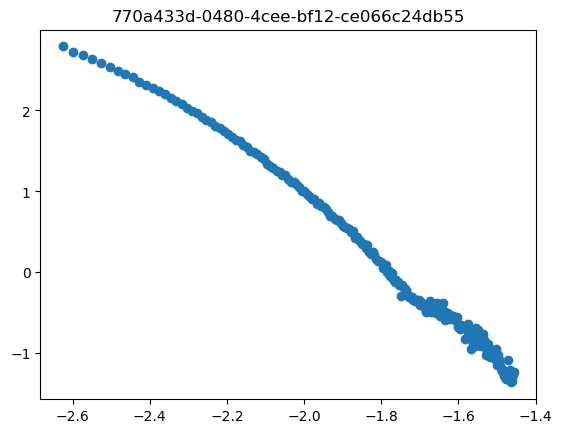

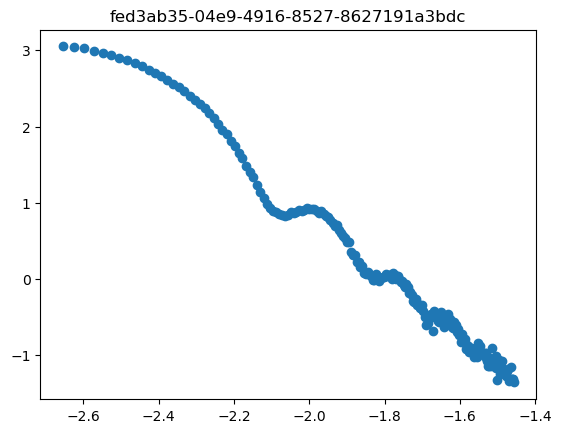

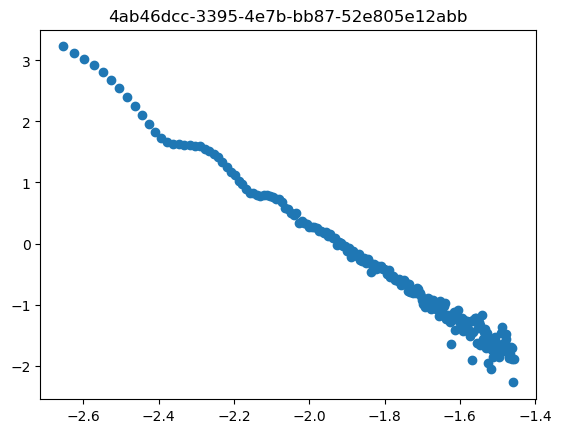

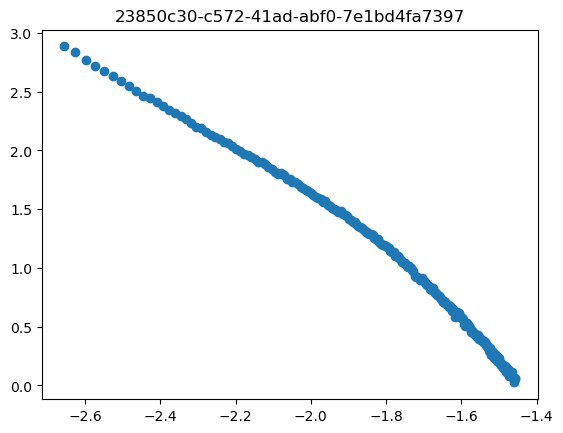

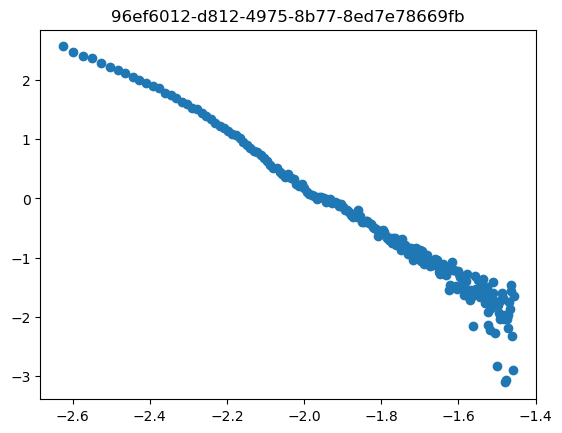

...

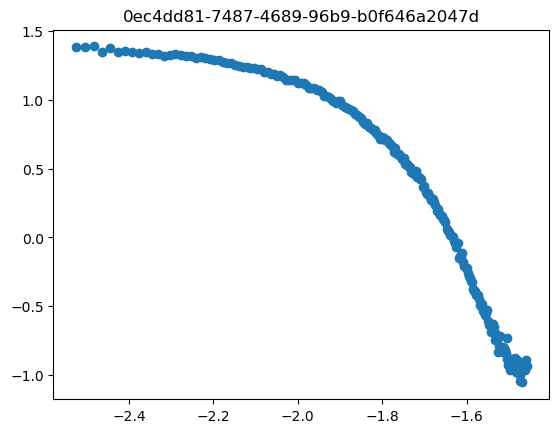

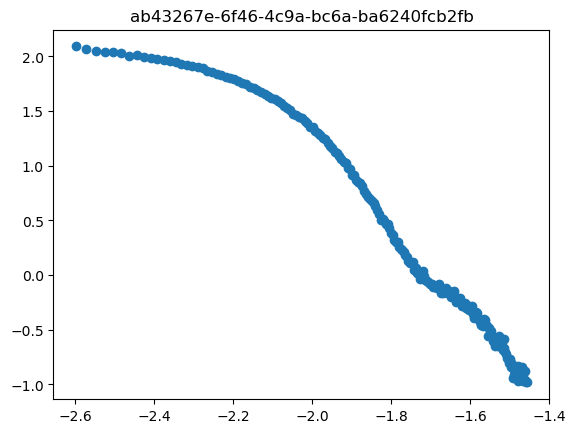

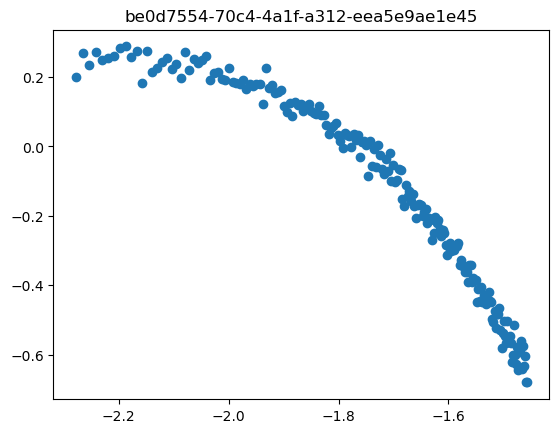

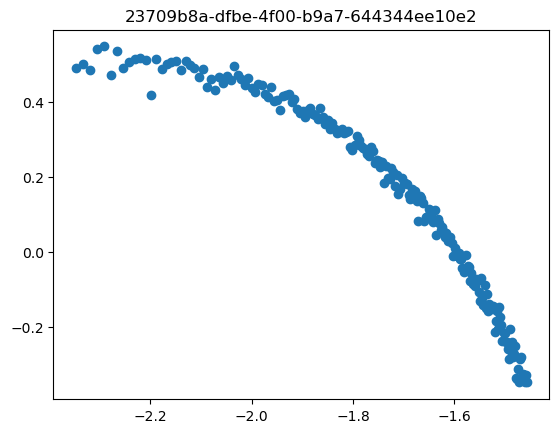

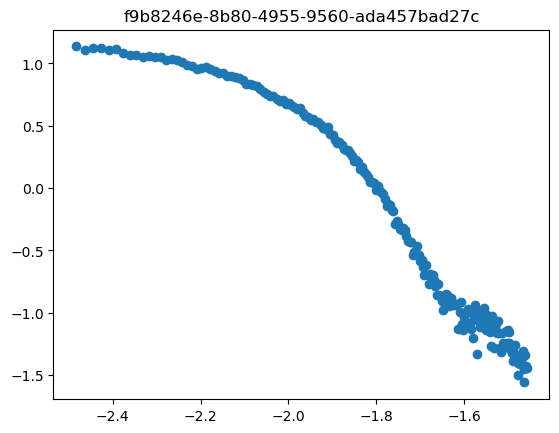

In [40]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']
    
        ax.scatter(q, I_subtracted)
        ax.set_title(uuid_val)

## Sanity check spline fit

/tmp/ipykernel_238814/3859189070.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


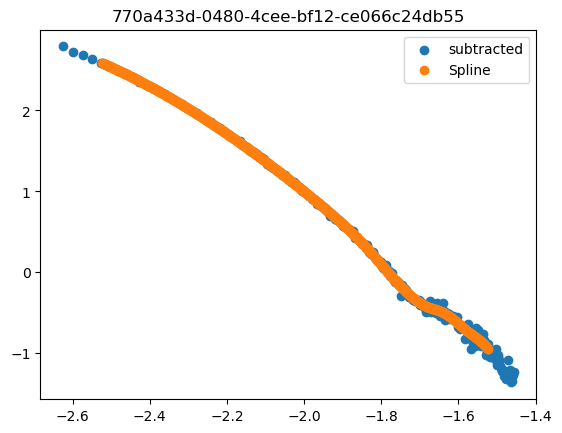

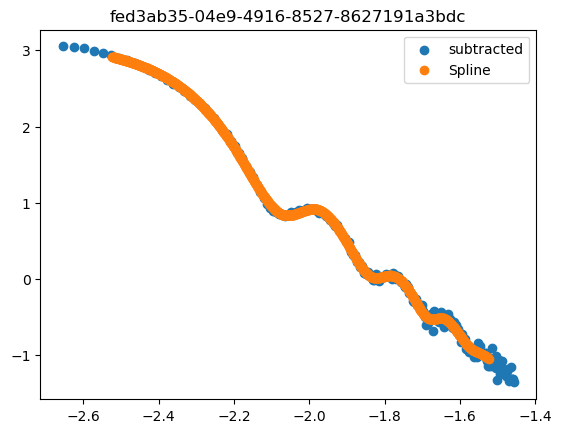

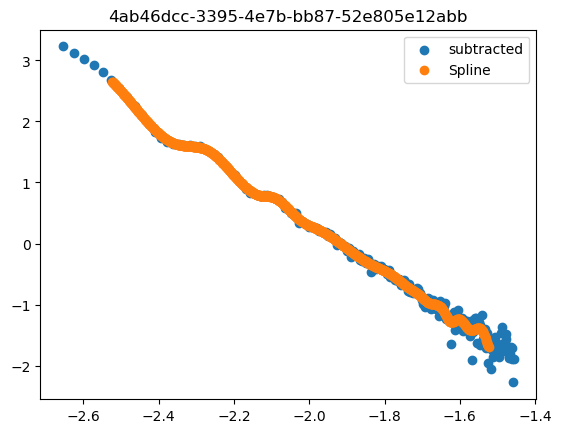

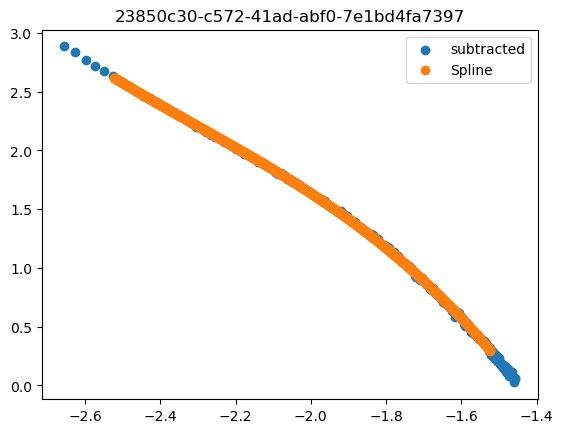

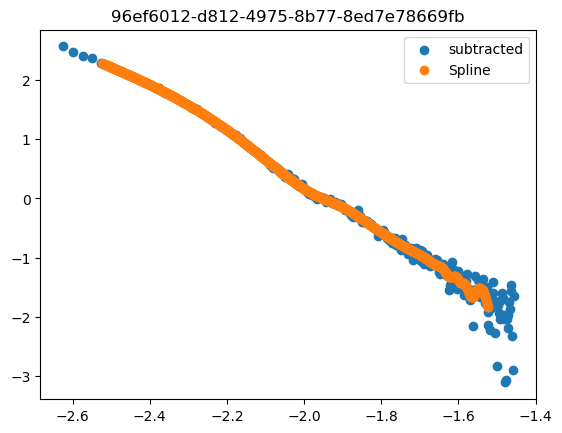

...

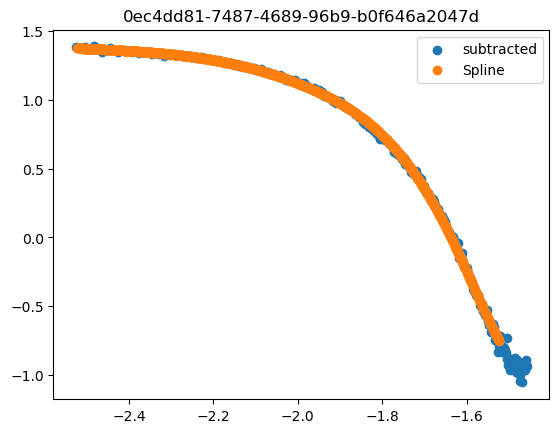

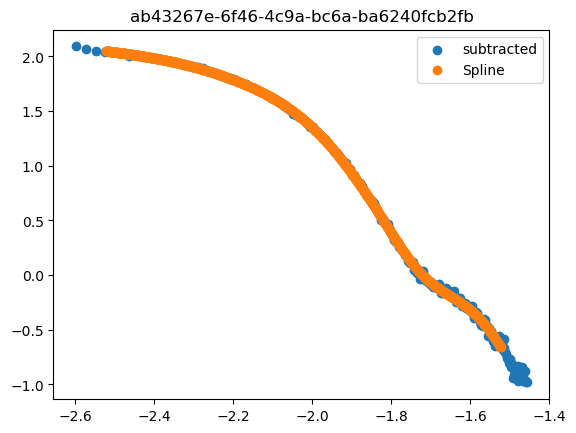

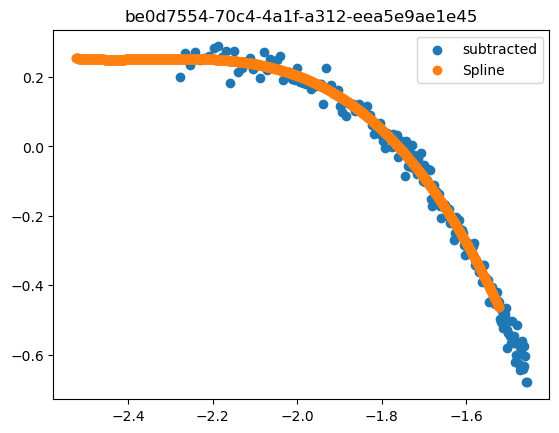

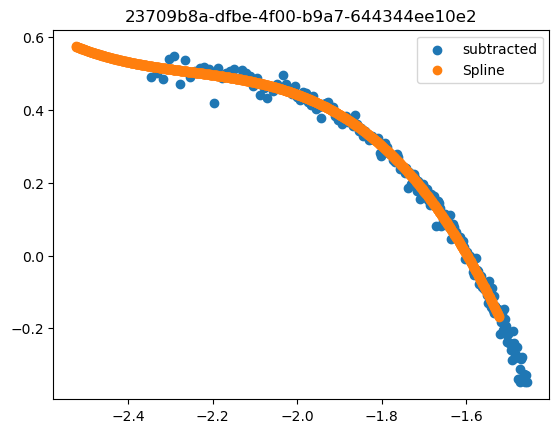

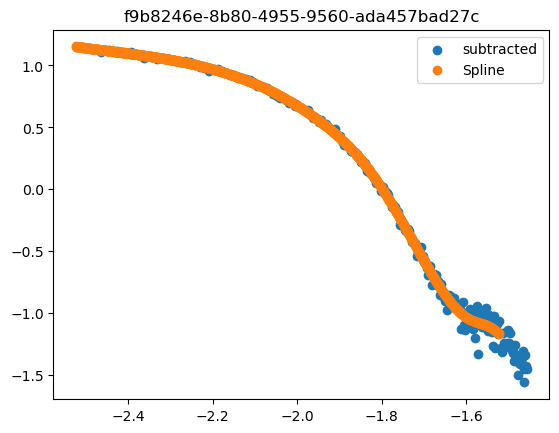

In [41]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()
    
        I_subtracted = entry['I_log']
        q = entry['q_log']

        I_spline = entry['I_spline']
        
    
        ax.scatter(q, I_subtracted, label = 'subtracted')
        ax.scatter(q_grid, I_spline, label = 'Spline')
        ax.legend()
        ax.set_title(uuid_val)

## Sanity check scaling

/tmp/ipykernel_111927/1900914898.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


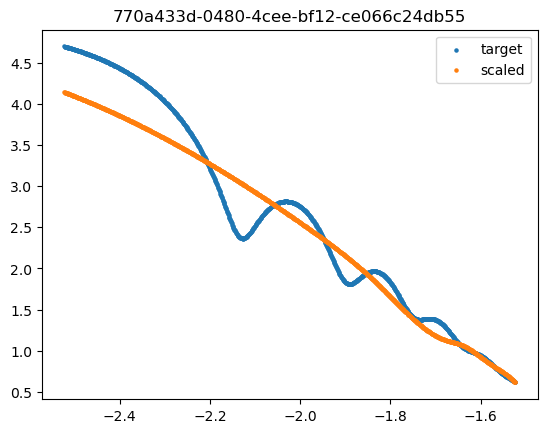

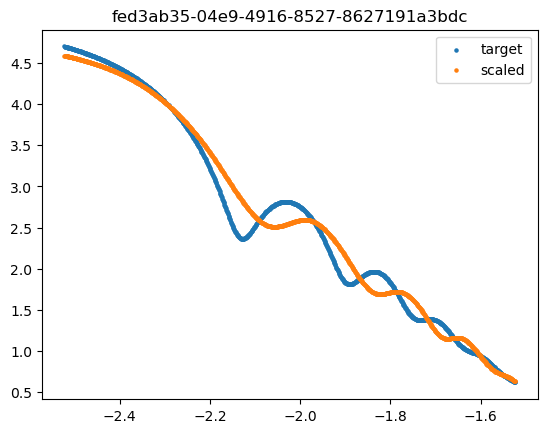

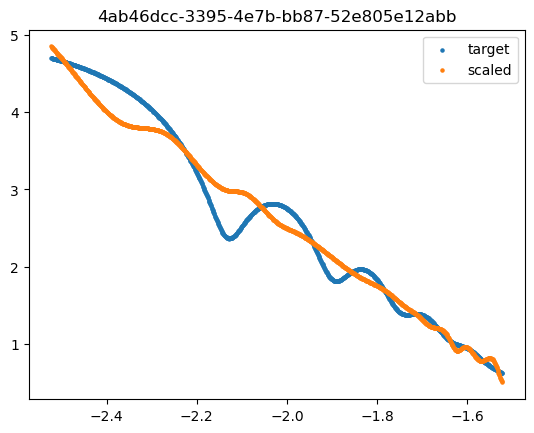

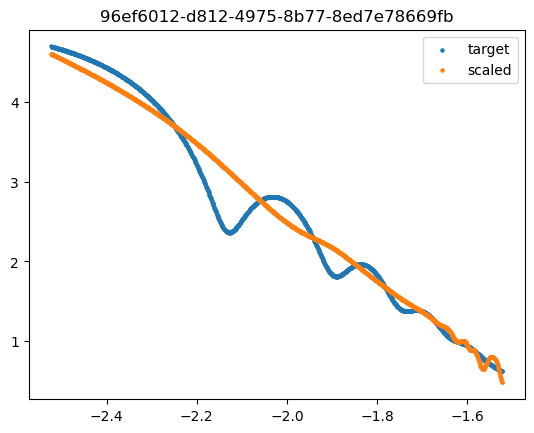

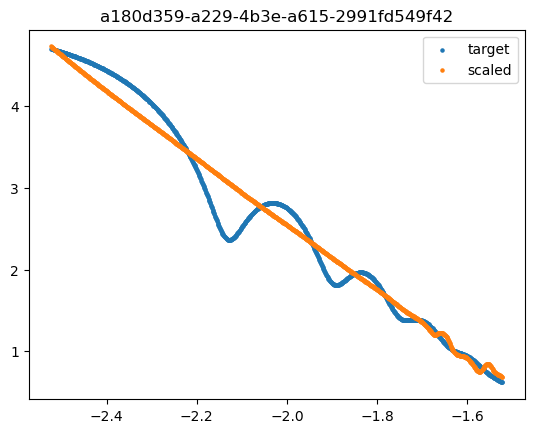

...

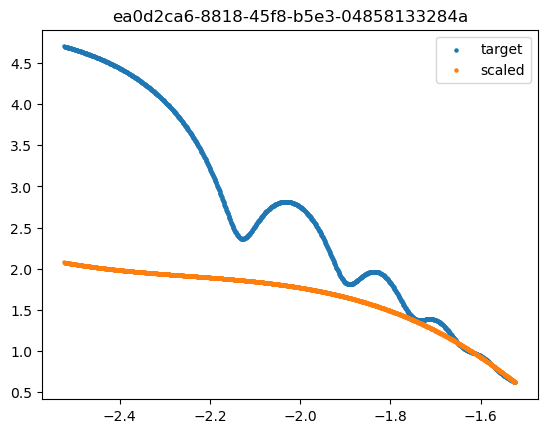

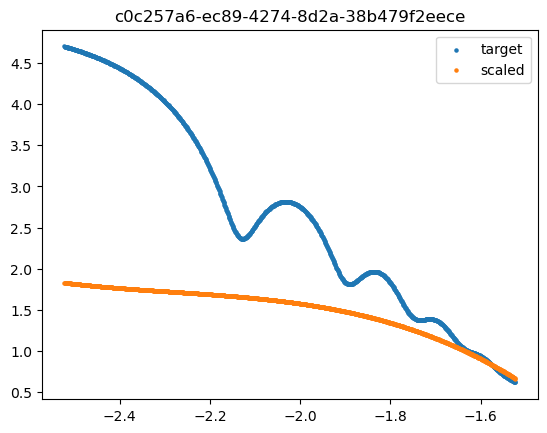

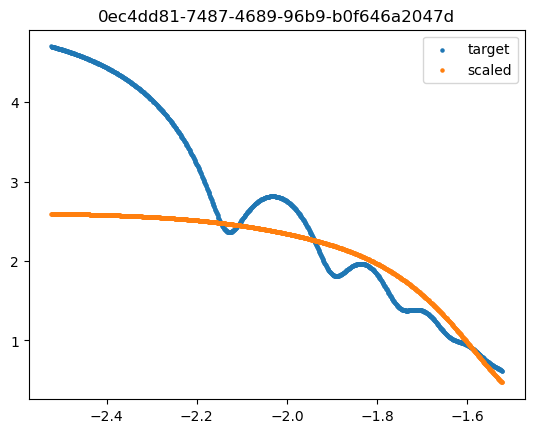

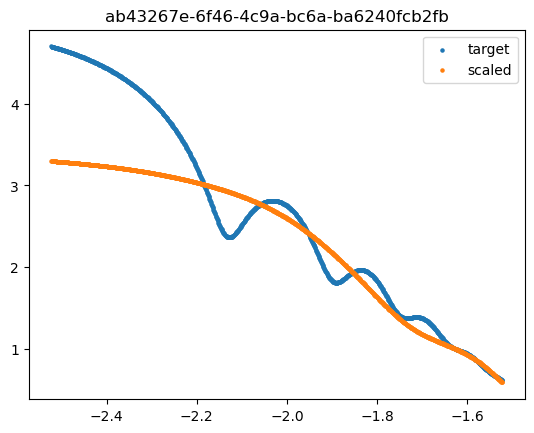

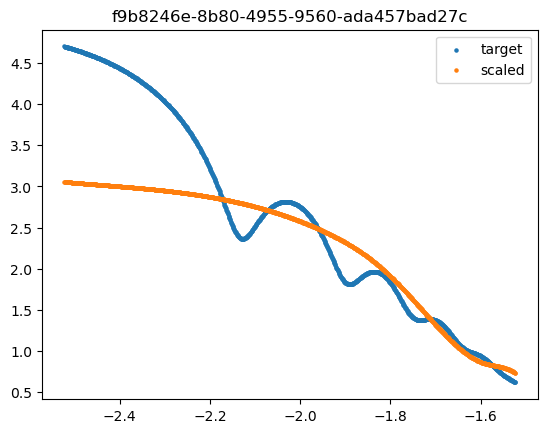

In [47]:
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        fig, ax = plt.subplots()


        I_scaled = entry['I_scaled']
        
    
        ax.scatter(q_grid, target_I, label = 'target', s = 5)
        ax.scatter(q_grid, I_scaled, label = 'scaled', s = 5)
        ax.legend()
        ax.set_title(uuid_val)

## Plot final ranked order of best samples

In [42]:
sum_ap = {}
for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        sum_ap[uuid_val] = entry['ap_sum_distance']


uuids = np.array(list(sum_ap.keys()))
rmses = list(sum_ap.values())
uuid_sorted_sum = uuids[np.argsort(rmses)]

In [43]:

with PdfPages('ranked_apdist_results_torch.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_sum):

        entry  = processing_dataset[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = sum_ap[uuid_val]
    
        fig, ax = plt.subplots()
        ax.scatter(q_grid, target_I)
        ax.scatter(q_grid, I_scaled)
        ax.set_title(uuid_val)
        ax.text(0.1, 0.05, f'Rank: {i}, sum distance: {distance}', transform = ax.transAxes)
        pdf.savefig()
        plt.close()

## Plot RMSE ranked for comparison

In [37]:
rmse_dist = {}
for uuid_val, entry in processing_dataset_rmse.items():
    try:
        status = entry['status']
        if status == 'failed':
            continue
        else:
            raise KeyError
    except KeyError:
        try:
            rmse_dist[uuid_val] = entry['rmse_distance']
        except:
            continue


uuids = np.array(list(rmse_dist.keys()))
rmses = list(rmse_dist.values())
uuid_sorted_rmse = uuids[np.argsort(rmses)]

In [43]:

with PdfPages('ranked_rmse_dist_results.pdf') as pdf:
    for i, uuid_val in enumerate(uuid_sorted_rmse):
    
        entry  = processing_dataset_rmse[uuid_val]
        I_scaled = entry['I_scaled']
        
        distance = rmse_dist[uuid_val]
        
        fig, ax = plt.subplots()
        ax.scatter(q_grid, target_I)
        ax.scatter(q_grid, I_scaled)
        ax.set_title(uuid_val)
        ax.text(0.1, 0.05, f'Rank: {i}, RMSE distance: {distance}', transform = ax.transAxes)
        pdf.savefig()
        plt.close()

## Write results to disk

In [74]:
uuid_vals = []
amplitude = []
phase = []
sum_ap = []
statuses = []

for uuid_val, entry in processing_dataset.items():
    try:
        status = entry['status']
        if status == 'failed':
            uuid_vals.append(uuid_val)
            amplitude.append(None)
            phase.append(None)
            sum_ap.append(None)
            statuses.append('failed')
            continue
        else:
            raise KeyError
    except KeyError:
        uuid_vals.append(uuid_val)
        amplitude.append(entry['amplitude_distance'])
        phase.append(entry['phase_distance'])
        sum_ap.append(entry['ap_sum_distance'])
        statuses.append('success')
    

In [75]:
results_df = pd.DataFrame({'uuid':uuid_vals, 'amplitude_distance':amplitude, 'phase_distance':phase, 'sum_ap_distance':sum_ap, 'processes_status':statuses})

In [76]:
results_df

,uuid,amplitude_distance,phase_distance,sum_ap_distance,processes_status
0,770a433d-0480-4cee-bf12-ce066c24db55,1.079610,0.407451,1.487061,success
1,fed3ab35-04e9-4916-8527-8627191a3bdc,0.474113,0.177540,0.651653,success
2,4ab46dcc-3395-4e7b-bb87-52e805e12abb,0.979413,0.540022,1.519435,success
3,23850c30-c572-41ad-abf0-7e1bd4fa7397,NaN,NaN,NaN,failed
4,96ef6012-d812-4975-8b77-8ed7e78669fb,1.003274,0.520217,1.523491,success
...,...,...,...,...,...
135,0ec4dd81-7487-4689-96b9-b0f646a2047d,1.303809,0.487639,1.791449,success
136,ab43267e-6f46-4c9a-bc6a-ba6240fcb2fb,1.189645,0.420578,1.610223,success
137,be0d7554-70c4-4a1f-a312-eea5e9ae1e45,NaN,NaN,NaN,failed
138,23709b8a-dfbe-4f00-b9a7-644344ee10e2,NaN,NaN,NaN,failed


In [77]:
results_df.to_csv('amplitude_phase_results_11_11_24.csv')